In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
pd.options.display.max_rows = 50
pd.options.display.max_colwidth = 50
import matplotlib.pyplot as plt

In [3]:
loan_data = pd.read_csv('https://s3.us-east-2.amazonaws.com/upgraddocs/loan.csv')
loan_data.head()

/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (47) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [4]:
loan_data.shape

(39717, 111)

In [5]:
loan_data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
id                                39717 non-null int64
member_id                         39717 non-null int64
loan_amnt                         39717 non-null int64
funded_amnt                       39717 non-null int64
funded_amnt_inv                   39717 non-null float64
term                              39717 non-null object
int_rate                          39717 non-null object
installment                       39717 non-null float64
grade                             39717 non-null object
sub_grade                         39717 non-null object
emp_title                         37258 non-null object
emp_length                        38642 non-null object
home_ownership                    39717 non-null object
annual_inc                        39717 non-null float64
verification_status               39717 non-null object
issue_d                           39717 non-null ob

In [6]:
len(loan_data['term'].unique())

2

In [7]:
loan_data.describe(include='all').loc['unique', :]

id                                  NaN
member_id                           NaN
loan_amnt                           NaN
funded_amnt                         NaN
funded_amnt_inv                     NaN
term                                  2
int_rate                            371
installment                         NaN
grade                                 7
sub_grade                            35
emp_title                         28820
emp_length                           11
home_ownership                        5
annual_inc                          NaN
verification_status                   3
issue_d                              55
loan_status                           3
pymnt_plan                            1
url                               39717
desc                              26527
purpose                              14
title                             19615
zip_code                            823
addr_state                           50
dti                                 NaN


In [8]:
loan_data['collections_12_mths_ex_med'].unique()

array([ 0., nan])

In [9]:
loan_data['policy_code'].unique()

array([1])

In [10]:
loan_data['dti_joint'].unique()

array([nan])

In [11]:
loan_data['term'].unique()

array([' 36 months', ' 60 months'], dtype=object)

In [12]:
loan_data['installment'].unique()

array([162.87,  59.83,  84.33, ...,  78.42, 275.38, 255.43])

In [13]:
loan_data['pymnt_plan'].unique()

array(['n'], dtype=object)

In [14]:
loan_data['initial_list_status'].unique()

array(['f'], dtype=object)

In [15]:
loan_data['mths_since_last_major_derog'].unique()

array([nan])

In [16]:
loan_data['next_pymnt_d'].unique()

array([nan, 'Jun-16', 'Jul-16'], dtype=object)

In [17]:
loan_data.shape

(39717, 111)

In [18]:
for col in loan_data:
    print(col, len(loan_data[col].unique()))

id 39717
member_id 39717
loan_amnt 885
funded_amnt 1041
funded_amnt_inv 8205
term 2
int_rate 371
installment 15383
grade 7
sub_grade 35
emp_title 28821
emp_length 12
home_ownership 5
annual_inc 5318
verification_status 3
issue_d 55
loan_status 3
pymnt_plan 1
url 39717
desc 26528
purpose 14
title 19616
zip_code 823
addr_state 50
dti 2868
delinq_2yrs 11
earliest_cr_line 526
inq_last_6mths 9
mths_since_last_delinq 96
mths_since_last_record 112
open_acc 40
pub_rec 5
revol_bal 21711
revol_util 1090
total_acc 82
initial_list_status 1
out_prncp 1137
out_prncp_inv 1138
total_pymnt 37850
total_pymnt_inv 37518
total_rec_prncp 7976
total_rec_int 35148
total_rec_late_fee 1356
recoveries 4040
collection_recovery_fee 2616
last_pymnt_d 102
last_pymnt_amnt 34930
next_pymnt_d 3
last_credit_pull_d 107
collections_12_mths_ex_med 2
mths_since_last_major_derog 1
policy_code 1
application_type 1
annual_inc_joint 1
dti_joint 1
verification_status_joint 1
acc_now_delinq 1
tot_coll_amt 1
tot_cur_bal 1
open_acc

In [19]:
loan_data['url'].head()

0    https://lendingclub.com/browse/loanDetail.acti...
1    https://lendingclub.com/browse/loanDetail.acti...
2    https://lendingclub.com/browse/loanDetail.acti...
3    https://lendingclub.com/browse/loanDetail.acti...
4    https://lendingclub.com/browse/loanDetail.acti...
Name: url, dtype: object

In [20]:
loan_data.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,280.220000,5.900000e+04,13.400000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,430.780000,8.230000e+04,18.600000,0.000000,1.000000,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
max,1.077501e+06,1.314167e+06,35000.000000,35000.000000,35000.000000,1305.190000,6.000000e+06,29.990000,11.000000,8.000000,...,NaN,NaN,NaN,NaN,2.000000,0.0,NaN,NaN,NaN,NaN


In [21]:
loan_data['loan_amnt'].describe()

count    39717.000000
mean     11219.443815
std       7456.670694
min        500.000000
25%       5500.000000
50%      10000.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64

In [22]:
loan_data['funded_amnt'].describe()

count    39717.000000
mean     10947.713196
std       7187.238670
min        500.000000
25%       5400.000000
50%       9600.000000
75%      15000.000000
max      35000.000000
Name: funded_amnt, dtype: float64

In [23]:
loan_data['int_rate'].describe()

count      39717
unique       371
top       10.99%
freq         956
Name: int_rate, dtype: object

In [24]:
loan_data['emp_title'].describe()

count       37258
unique      28820
top       US Army
freq          134
Name: emp_title, dtype: object

In [25]:
loan_data['revol_bal'].describe()



count     39717.000000
mean      13382.528086
std       15885.016641
min           0.000000
25%        3703.000000
50%        8850.000000
75%       17058.000000
max      149588.000000
Name: revol_bal, dtype: float64

<Figure size 7200x7200 with 0 Axes>

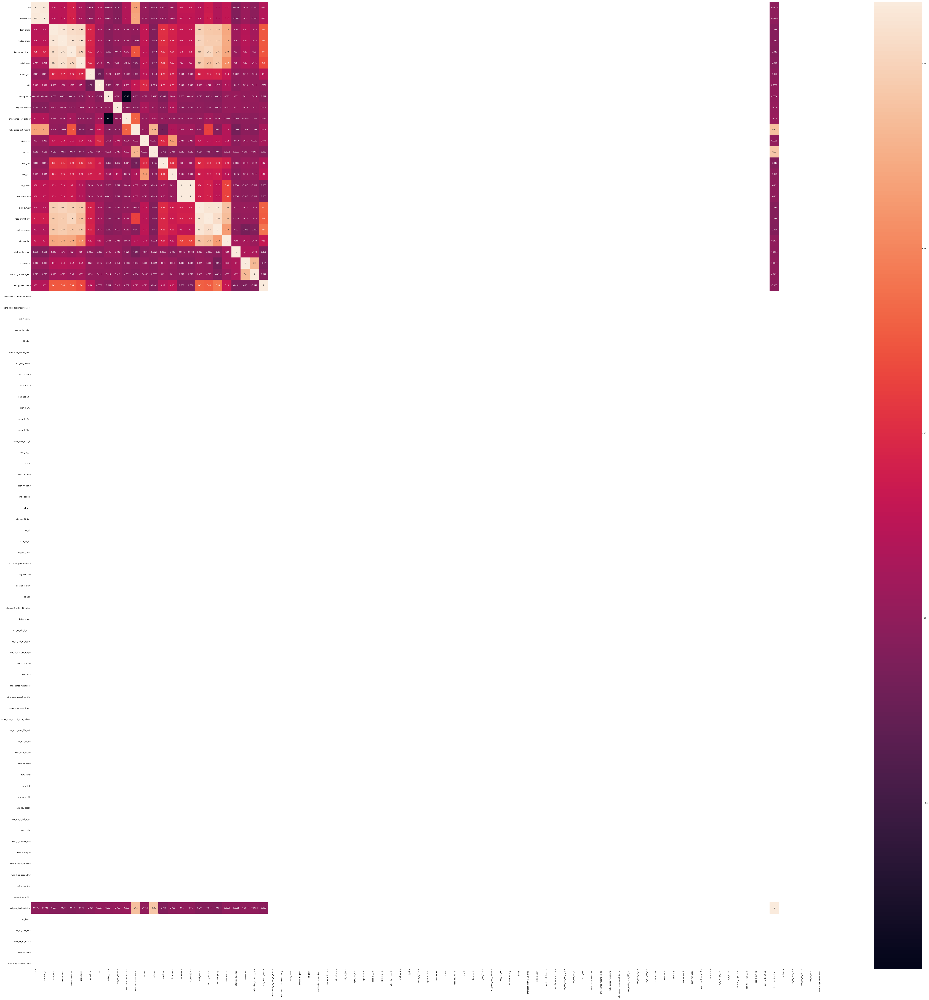

In [306]:
plt.figure(figsize=(100, 100))
loan_data_corr = loan_data.corr()
sns.heatmap(loan_data_corr, 
            xticklabels = loan_data_corr.columns.values,
            yticklabels = loan_data_corr.columns.values,
            annot = True);
plt.show()

In [26]:
loan_data['initial_list_status'].unique()

array(['f'], dtype=object)

In [27]:
loan_data['loan_status'].unique()

array(['Fully Paid', 'Charged Off', 'Current'], dtype=object)

In [28]:
loan_data['funded_amnt_inv'].sum()

412955476.6804634

In [29]:
loan_data['funded_amnt'].sum()

434810325

In [30]:
loan_data['loan_amnt'].sum()

445602650

In [31]:
loan_data['installment'].head()

0    162.87
1     59.83
2     84.33
3    339.31
4     67.79
Name: installment, dtype: float64

In [32]:
loan_data['grade'].head()

0    B
1    C
2    C
3    C
4    B
Name: grade, dtype: object

In [33]:
loan_data['emp_title'].head()

0                         NaN
1                       Ryder
2                         NaN
3         AIR RESOURCES BOARD
4    University Medical Group
Name: emp_title, dtype: object

In [34]:
loan_data.shape

(39717, 111)

### Data cleaning:

In [35]:
loan_data.shape

(39717, 111)

In [36]:
loan_data.dropna(how='all', inplace=True, axis='columns')
loan_data.shape

(39717, 57)

In [37]:
print(loan_data.tax_liens.unique())
loan_data.drop(columns=['tax_liens', 'chargeoff_within_12_mths'], inplace=True)
loan_data.shape

[ 0. nan]


(39717, 55)

In [38]:
#======> remove the columns where there is only one value... it's correlation is always 1
loan_data.drop(columns=['policy_code', 'application_type', 'initial_list_status'], inplace=True)
loan_data.shape

(39717, 52)

In [39]:
print(loan_data.collections_12_mths_ex_med.unique())
loan_data.drop(columns=['collections_12_mths_ex_med'], inplace=True)
loan_data.shape

[ 0. nan]


(39717, 51)

In [40]:
loan_data['defaulted'] = loan_data['loan_status'].apply(lambda x: 1 if x == 'Charged Off' else 0)
loan_data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,acc_now_delinq,delinq_amnt,pub_rec_bankruptcies,defaulted
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,0.00,0.00,Jan-15,171.62,NaN,May-16,0,0,0.0,0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0,0,0.0,1
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,0.00,0.00,Jun-14,649.91,NaN,May-16,0,0,0.0,0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0,0,0.0,0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,0.00,0.00,May-16,67.79,Jun-16,May-16,0,0,0.0,0


<Figure size 2160x2160 with 0 Axes>

<Figure size 2160x2160 with 0 Axes>

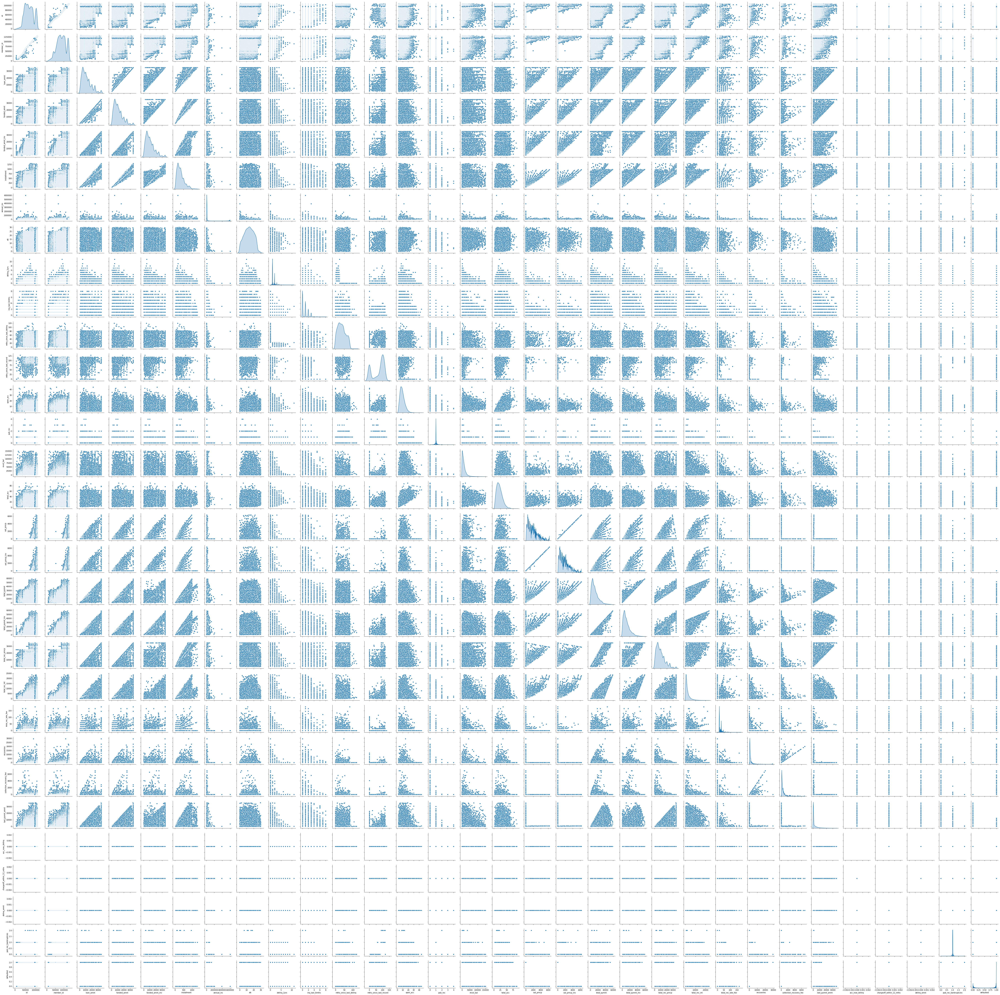

In [158]:
plt.figure(figsize=(30, 30))

sns.pairplot(loan_data, diag_kind='kde')
plt.show()

In [41]:
total = loan_data.isnull().sum().sort_values(ascending=False)
percent = (loan_data.isnull().sum()/loan_data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
next_pymnt_d,38577,0.971297
mths_since_last_record,36931,0.929854
mths_since_last_delinq,25682,0.646625
desc,12940,0.325805
emp_title,2459,0.061913
emp_length,1075,0.027066
pub_rec_bankruptcies,697,0.017549
last_pymnt_d,71,0.001788
revol_util,50,0.001259
title,11,0.000277


In [42]:
loan_data.drop(columns=['next_pymnt_d', 'mths_since_last_record', 'mths_since_last_delinq'], inplace=True)
loan_data.shape

(39717, 49)

In [43]:
for k in loan_data:
    print(k)
    print(loan_data[k].describe())

id
count    3.971700e+04
mean     6.831319e+05
std      2.106941e+05
min      5.473400e+04
25%      5.162210e+05
50%      6.656650e+05
75%      8.377550e+05
max      1.077501e+06
Name: id, dtype: float64
member_id
count    3.971700e+04
mean     8.504636e+05
std      2.656783e+05
min      7.069900e+04
25%      6.667800e+05
50%      8.508120e+05
75%      1.047339e+06
max      1.314167e+06
Name: member_id, dtype: float64
loan_amnt
count    39717.000000
mean     11219.443815
std       7456.670694
min        500.000000
25%       5500.000000
50%      10000.000000
75%      15000.000000
max      35000.000000
Name: loan_amnt, dtype: float64
funded_amnt
count    39717.000000
mean     10947.713196
std       7187.238670
min        500.000000
25%       5400.000000
50%       9600.000000
75%      15000.000000
max      35000.000000
Name: funded_amnt, dtype: float64
funded_amnt_inv
count    39717.000000
mean     10397.448868
std       7128.450439
min          0.000000
25%       5000.000000
50%       89

In [44]:
loan_data.drop(columns=['acc_now_delinq'], inplace=True)

In [45]:
print(loan_data['delinq_amnt'].unique())
loan_data.drop(columns=['delinq_amnt'], inplace=True)

[0]


In [46]:
loan_data.shape

(39717, 47)

In [47]:
loan_data.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'pub_rec_bankruptcies', 'defaulted'],
      dtype='object')

In [48]:
loan_data['defaulted'].describe()

count    39717.000000
mean         0.141677
std          0.348723
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: defaulted, dtype: float64

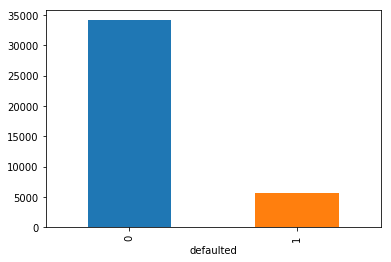

In [49]:
loan_data.groupby('defaulted')['defaulted'].count().plot.bar()

/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


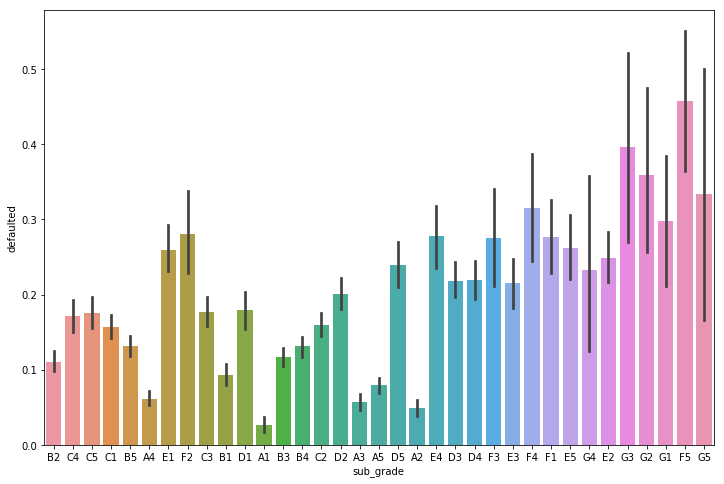

In [50]:
plt.figure(figsize=(12, 8))
sns.barplot(data=loan_data, y='defaulted', x='sub_grade')
plt.show()

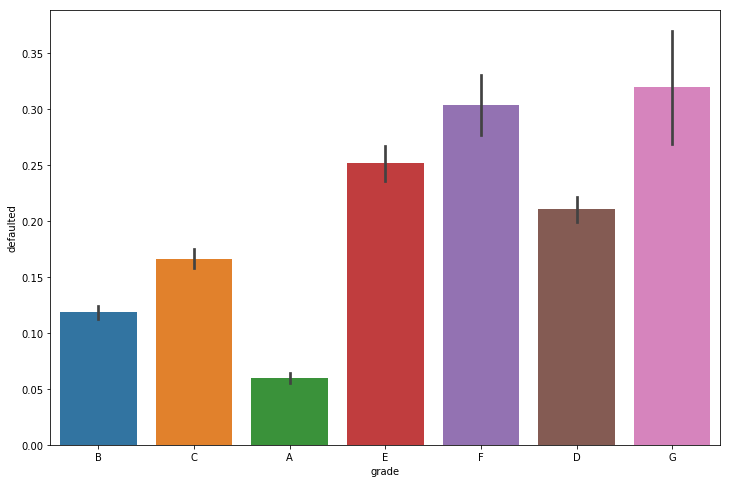

In [51]:
plt.figure(figsize=(12, 8))
sns.barplot(data=loan_data, y='defaulted', x='grade')
plt.show()

In [52]:
loan_data.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'pub_rec_bankruptcies', 'defaulted'],
      dtype='object')

In [53]:
loan_data.shape

(39717, 47)

In [54]:
df = pd.concat([loan_data['defaulted'], loan_data['grade']], axis=1)
df.head()

,defaulted,grade
0,0,B
1,1,C
2,0,C
3,0,C
4,0,B


In [55]:
total = loan_data.groupby('grade').agg({'defaulted': ['count', 'sum']})
total

defaulted      
          count   sum
grade                
A         10085   602
B         12020  1425
C          8098  1347
D          5307  1118
E          2842   715
F          1049   319
G           316   101

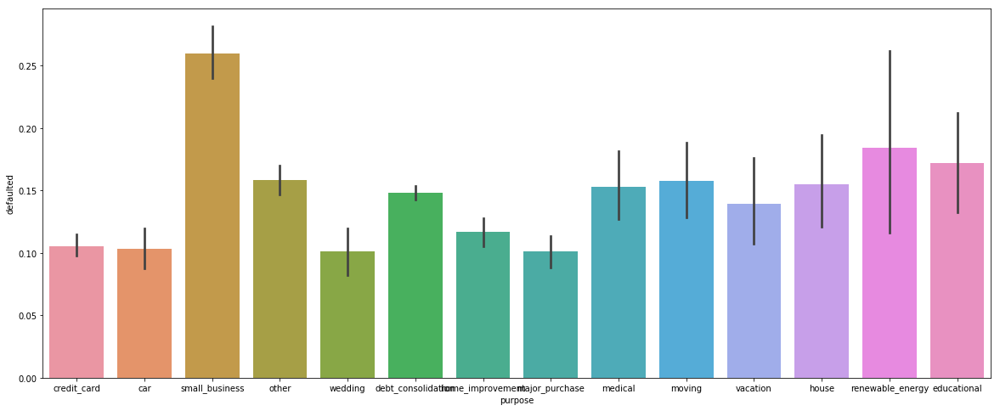

In [56]:
plt.figure(figsize=(20, 8))
sns.barplot(data=loan_data, y='defaulted', x='purpose')
plt.show()

In [83]:

loan_data.int_rate.replace('%', '', inplace=True, regex=True)
loan_data.int_rate.astype('float64')
loan_data.int_rate.head()

0    10.65
1    15.27
2    15.96
3    13.49
4    12.69
Name: int_rate, dtype: object

In [96]:
# plt.figure(figsize=(20, 8))

# sns.boxplot(data=loan_data, y='int_rate', x='grade')

# plt.show()
# len(loan_data.int_rate.unique())

In [57]:
loan_data.issue_d = pd.to_datetime(loan_data['issue_d'], format='%b-%y')
loan_data.loc[:, 'issue_year'] = loan_data.issue_d.dt.year

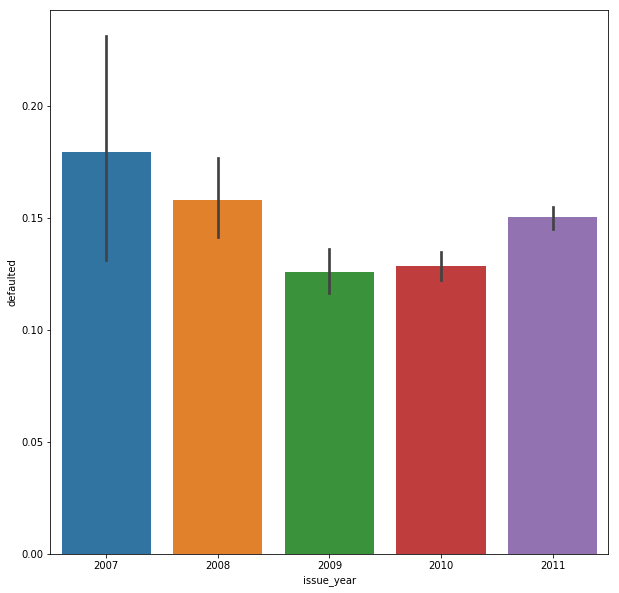

In [101]:
plt.figure(figsize=(10, 10))
loan_data[loan_data['defaulted'] == 1]
sns.barplot(data=loan_data, y='defaulted', x='issue_year')
plt.show()

In [117]:
print(loan_data.annual_inc.min())
print(loan_data.annual_inc.max())

4000.0
6000000.0


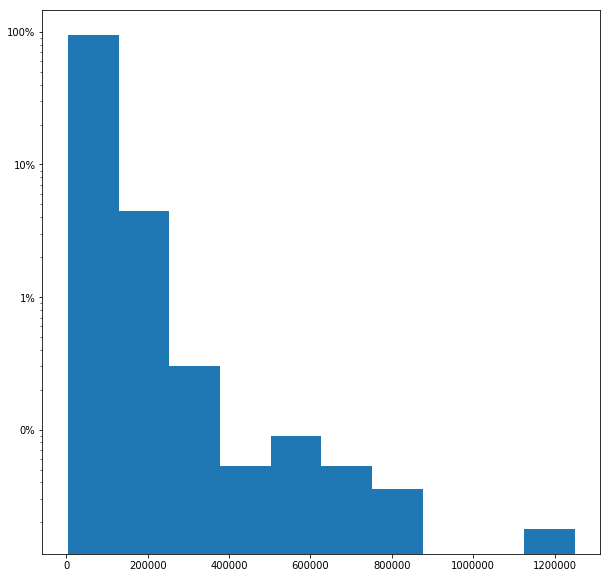

In [134]:
from matplotlib.ticker import PercentFormatter
plt.figure(figsize=(10, 10))
_d = loan_data[loan_data.defaulted == 1]

plt.hist(_d['annual_inc'], bins = 10, log = True, weights=np.ones(len(_d)) / len(_d))
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))

# plt.set_xscale('log')
# plt.xscale('log')
plt.show()

In [141]:
(_d[_d['annual_inc'] < 200000].shape[0]) / _d['annual_inc'].shape[0]

0.9873822640838813

In [151]:
_d[_d['annual_inc'] < 200000].loc[:, ['annual_inc', 'defaulted']].count()

annual_inc    5556
defaulted     5556
dtype: int64